In [1]:
#%%appyter init
from appyter import magic
magic.init(lambda _=globals: _())

In [2]:
%%appyter hide_code
{% do SectionField(
    name='PRIMARY',
    title='Upload gene sets',
    subtitle='Upload your up and down gene sets',
    img='file-upload.png'
) %}

In [3]:
%%appyter code_exec

{% set title = StringField(
    name='title',
    label='Notebook name',
    default='L1000FWD Consensus Drugs',
    section="PRIMARY",
) %}

title = {{ title }}

```python

title = '''L1000FWD Consensus Drugs'''
```

Returns top mimicker and reverser drugs from a set of up and down genesets

In [4]:
import re
import math
import time
import requests
import pandas as pd
import json
import scipy.stats as st
from IPython.display import display, IFrame, Markdown
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
%%appyter markdown
# {{title}}

# L1000FWD Consensus Drugs

In [6]:
L1000FWD_URL = 'https://maayanlab.cloud/L1000FWD'
pattern = ".*:(?P<drug>BRD-\w*)(-\d*){,3}:.*"
clustergrammer_url = 'https://amp.pharm.mssm.edu/clustergrammer/matrix_upload/'

In [7]:
def clustergrammer(df, name, clustergrammer_url, fignum=1, label="Clustergrammer"):
    clustergram_df = df.rename(columns={i:"Signature: %s"%i for i in df.columns}, index={i:"Drug: %s"%i for i in df.index})
    clustergram_df.to_csv(name, sep="\t")
    response = ''
    for i in range(5):
        try:
            res = requests.post(clustergrammer_url, files={'file': open(name, 'rb')})
            if not res.ok:
                response = res.text
                time.sleep(1)
            else:
                clustergrammer_url = res.text.replace("http:","https:")   
                break
        except Exception as e:
            response = e
            time.sleep(2)
    else:
        if type(response) == Exception:
            raise response
        else:
            raise Exception(response)
    display(IFrame(clustergrammer_url, width="1000", height="1000"))
    display(Markdown("**Figure %d** %s [Go to url](%s)"%(fignum, label, clustergrammer_url)))

In [8]:
cmap = sns.cubehelix_palette(50, hue=0.05, rot=0, light=1, dark=0)
def heatmap(df, filename, width=15, height=15):
#     fig = plt.figure(figsize=(width,height))
    cg = sns.clustermap(df, cmap=cmap, figsize=(width, height))
    cg.ax_row_dendrogram.set_visible(False)
    cg.ax_col_dendrogram.set_visible(False)
    display(cg)
    cg.savefig(filename)

## L1000FWD Drug Metadata
Get drug metadata from L1000FWD [1]

In [9]:
drug_meta = pd.read_csv("https://amp.pharm.mssm.edu/l1000fwd/download/Drugs_metadata.csv", index_col=0)

In [10]:
drug_meta.head(10)

,LSM_id,pert_iname,alt_name,canonical_smiles,inchi_key,inchi_string,molecular_formula,molecular_wt,pert_collection,pert_summary,pert_url,pubchem_cid
pert_id,,,,,,,,,,,,
BRD-A00100033,LSM-1232,nifurtimox,NaN,CC1CS(=O)(=O)CCN1N=Cc2ccc(o2)[N+](=O)[O-],InChIKey=ARFHIAQFJWUCFH-UHFFFAOYSA-N,"InChI=1S/C10H13N3O5S/c1-8-7-19(16,17)5-4-12(8)...",C10H13N3O5S,287.292,BIOA,NaN,http://en.wikipedia.org/wiki/Nifurtimox,6842999
BRD-A00520476,LSM-22625,otenzepad,AF-DX 116,CCN(CC)CC1CCCCN1CC(=O)N2c3ccccc3C(=O)Nc4cccnc24,InChIKey=UBRKDAVQCKZSPO-UHFFFAOYSA-N,InChI=1S/C24H31N5O2/c1-3-27(4-2)16-18-10-7-8-1...,C24H31N5O2,421.535,BIOA,NaN,http://www.tocris.com/dispprod.php?ItemId=2135...,107867
BRD-A00546892,LSM-1235,biperiden,S1285,OC(CCN1CCCCC1)(C2CC3CC2C=C3)c4ccccc4,InChIKey=YSXKPIUOCJLQIE-UHFFFAOYSA-N,"InChI=1S/C21H29NO/c23-21(19-7-3-1-4-8-19,11-14...",C21H29NO,311.461,BIOA,Biperiden is an antiparkinsonian agent of the ...,"http://en.wikipedia.org/wiki/Biperiden,http://...",92151
BRD-A00758722,LSM-1237,noretynodrel,norethynodrel,C[C@@]12CCC3C(CCC4=C3CCC(=O)C4)C2CC[C@@]1(O)C#C,InChIKey=ICTXHFFSOAJUMG-OQPPHWFISA-N,InChI=1S/C20H26O2/c1-3-20(22)11-9-18-17-6-4-13...,C20H26O2,298.419,BIOA,NaN,"http://en.wikipedia.org/wiki/Norethynodrel,htt...",5702095
BRD-A00827783,LSM-4299,dyphylline,diprophylline,Cn1c(=O)n(C)c2ncn(CC(O)CO)c2c1=O,InChIKey=KSCFJBIXMNOVSH-UHFFFAOYSA-N,InChI=1S/C10H14N4O4/c1-12-8-7(9(17)13(2)10(12)...,C10H14N4O4,254.243,BIOA,NaN,http://en.wikipedia.org/wiki/Dyphylline,3182
BRD-A00993607,LSM-1238,alprenolol,NaN,CC(C)NCC(O)COc1ccccc1CC=C,InChIKey=PAZJSJFMUHDSTF-UHFFFAOYSA-N,InChI=1S/C15H23NO2/c1-4-7-13-8-5-6-9-15(13)18-...,C15H23NO2,285.810,BIOA,NaN,http://en.wikipedia.org/wiki/Alprenolol,66368
BRD-A01078468,LSM-4300,hexestrol,bibenzyl|S2473,CCC(C(CC)c1ccc(O)cc1)c2ccc(O)cc2,InChIKey=PBBGSZCBWVPOOL-UHFFFAOYSA-N,InChI=1S/C18H22O2/c1-3-17(13-5-9-15(19)10-6-13...,C18H22O2,270.366,BIOA,Hexestrol binds to ER&#945; and ER&#946; with ...,http://www.scbt.com/datasheet-205713-hexestrol...,3606
BRD-A01145011,LSM-6181,zebularine,PY-7715|S7113,OC[C@H]1O[C@H](C(O)[C@H]1O)n2cccnc2=O,InChIKey=RPQZTTQVRYEKCR-JJFBUQMESA-N,InChI=1S/C9H12N2O5/c12-4-5-6(13)7(14)8(16-5)11...,C9H12N2O5,228.202,BIOA,Zebularine is an orally active DNA methyltrans...,"http://en.wikipedia.org/wiki/Zebularine,http:/...",46783268
BRD-A01295252,LSM-1239,trans-7-hydroxy-pipat,NaN,CCCN(C/C=C/I)C1CCc2ccc(O)cc2C1,InChIKey=RTMIJLQPWFKAFE-FPYGCLRLSA-N,InChI=1S/C16H22INO/c1-2-9-18(10-3-8-17)15-6-4-...,C16H22INO,371.256,BIOA,NaN,NaN,6305587


**Table 1** Drug metadata taken from L1000FWD

## Empirical background distribution
Fetch precomputed background signatures. These were generated using CREEDS [2] signatures

In [11]:
empirical_mimickers_dist = pd.read_csv("https://appyters.maayanlab.cloud/storage/L1000FWDConsensus/creeds_drug_stats/CREEDS_mimickers_stat_new.tsv", sep="\t", index_col=0)
empirical_mimickers_dist.head(10)

,mean,stdev
erythrosine,0.097736,0.449800
bisindolylmaleimide,0.026353,0.173239
brefeldin-a,0.302674,1.007893
BRD-K58191509,0.005885,0.079765
PP-110,0.129589,0.466608
obatoclax,0.042983,0.208432
methylene-blue,0.071127,0.287592
paclitaxel,0.040936,0.210065
BRD-K05649647,0.088141,0.387277
canertinib,0.042599,0.210039


**Table 2** Empirical mean and standard deviation for mimicker drugs generated using CREEDS signatures

In [12]:
empirical_reversers_dist = pd.read_csv("https://appyters.maayanlab.cloud/storage/L1000FWDConsensus/creeds_drug_stats/CREEDS_reversers_stat_new.tsv", sep="\t", index_col=0)
empirical_reversers_dist.head(10)

,mean,stdev
BRD-K92317137,0.066905,0.286601
WZ-3105,0.092107,0.331262
BRD-A47816767,0.046693,0.232900
BRD-K41925105,0.027632,0.168545
VU-0418934-2,0.063451,0.303200
BRD-K08307026,0.068952,0.311794
YM-155,0.077523,0.319332
homoharringtonine,0.209287,0.656789
BRD-K84203638,0.042727,0.223872
ST-4029573,0.040169,0.204663


**Table 3** Empirical mean and standard deviation for reverser drugs generated using CREEDS signatures

## Read Input

In [13]:
%%appyter code_exec

{% set up_gene_sets = FileField(
    name='up_gene_sets',
    label='up gene sets',
    default='up_gene_sets.gmt',
    section="PRIMARY",
    examples={
        'up_gene_sets.gmt': 'https://appyters.maayanlab.cloud/storage/L1000FWDConsensus/sample_data/up_diseases'
    }
) %}

{% set down_gene_sets = FileField(
    name='down_gene_sets',
    label='down gene sets',
    default='down_gene_sets.gmt',
    section="PRIMARY",
    examples={
        'down_gene_sets.gmt': 'https://appyters.maayanlab.cloud/storage/L1000FWDConsensus/sample_data/down_diseases'
    }
) %}

up_gene_sets = {{ up_gene_sets }}
down_gene_sets = {{ down_gene_sets }}

```python
up_gene_sets = 'up_gene_sets.gmt'
down_gene_sets = 'down_gene_sets.gmt'
```

In [12]:
signatures = {}
with open(up_gene_sets) as upfile:
    for line in upfile:
        unpacked = line.strip().split("\t\t")
        if not len(unpacked) == 2:
            raise ValueError("GMT is not formatted properly, please consult the README of the appyter for proper formatting")
        sigid, geneset_str = unpacked
        geneset = geneset_str.split("\t")
        signatures[sigid] = {
            "up_genes": [i.split(",")[0] for i in geneset]
        }
with open(down_gene_sets) as downfile:
    for line in downfile:
        unpacked = line.strip().split("\t\t")
        if not len(unpacked) == 2:
            raise ValueError("GMT is not formatted properly, please consult the README of the appyter for proper formatting")
        sigid, geneset_str = unpacked
        geneset = geneset_str.split("\t")
        if sigid not in signatures:
            raise ValueError("%s did not match any of the up signatures, make sure that the signature names are the same for both up and down genes")
        else:
            signatures[sigid]["down_genes"] = [i.split(",")[0] for i in geneset]

In [13]:
input_sigs = pd.DataFrame.from_dict(signatures, orient="index")
input_sigs.head(10)

,up_genes,down_genes
GSE11343,"[SS18L1, NKX2-8, UNC13B, MED4, IMP3, TCP11X2, ...","[TMEM170A, PCGF6, ANKFY1, CNBP, PLEKHA1, RPL23..."
GSE10586,"[B3GALNT2, IQCF4, LUM, SMARCA1, TMEM52B, TRAV1...","[SRRM3, B3GALNT1, ZNF705G, ENTPD3, BTBD16, ESX..."
GSE11,"[PLEKHA3, C5ORF15, RSAD1, GATAD2A, NBEAL2, HPC...","[SS18L1, PEX19, LOC441052, HOMER3, AP1S1, TAAR..."
GSE10586 sample 9,"[LOC100420758, LOC101928767, LINC00893, LOC100...","[C9ORF135, IL1R1, PLEKHA2, LRRC37A2, EPR1, SCA..."
GSE12643 sample 274,"[ACVR1, IL1R1, AHNAK2, EML1, DCLK1, TM4SF1, MT...","[WSB1, WSB2, SCAF11, HOMER3, CACNA2D1, ACTN1, ..."
GSE2899 sample 299,"[MOGS, KRT7, SLC50A1, CCK, EID1, NISCH, SST, S...","[ZFP954, GAMT, CHGA, IL1R1, RPL21, AP1S1, SERP..."
GSE2899 sample 279,"[GBP7, GBP2B, ECH1, GM15448, CIDEC, COL1A2, CO...","[1810058I24RIK, WFDC21, AP1S1, SOX15, HPCAL1, ..."
GSE54917 sample 614,"[FNBP4, WFDC21, ADHFE1, 4921507L20RIK, RC3H1, ...","[CDK18, ZFP954, ARL10, ACSL3, AHNAK2, MOGS, 48..."
GSE4990 sample 474,"[RPL22, RPL23, RUNX1, LOC100362543, CELA1, NUP...","[SND1, WSB1, MX1, RPL24, CNBP, SEPP1, PSMB9, T..."
GSE2899 sample 45,"[NKX2-9, AW112010, IFITM10, ECH1, MX2, SERPIND...","[KRT8, ACSL5, CIDEA, COL1A1, RBP4, IFI27, UQCR..."


**Table 4** Input signatures

## L1000FWD
Perform signature search using L1000FWD (https://amp.pharm.mssm.edu/l1000fwd/) 

In [14]:
num_sigs = len(signatures)
print("Total number of signatures: %d"% num_sigs)

Total number of signatures: 26


In [15]:
sig_search_endpoint = "/sig_search"
count = 1
response = ''
for k,v in signatures.items():    
    print("Querying (%d/%d): %s"%(count, num_sigs, k), end="\r", flush=True)
    count += 1
    payload = v
    for tries in range(5):
        try:
            res = requests.post(L1000FWD_URL + sig_search_endpoint, json=payload)
            if res.ok:
                result_id = res.json()["result_id"]
                signatures[k]["result_id"] = result_id
                time.sleep(0.1)
                break
            else:
                response = res.text
                time.sleep(0.2)
        except Exception as e:
            response = e
            time.sleep(1)
    else:
        if type(response) == Exception:
            raise response
        else:
            raise Exception(response)

In [16]:
topn_endpoint = "/result/topn/"
count = 1
response = ''
for k,v in signatures.items():    
    print("Querying (%d/%d): %s"%(count, num_sigs, k), end="\r", flush=True)
    count += 1
    endpoint = topn_endpoint + v["result_id"]
    for tries in range(5):
        try:
            res = requests.get(L1000FWD_URL + endpoint)
            if res.ok:
                results = res.json()
                signatures[k].update(results)
                time.sleep(0.1)
                break
            else:
                response = res.text
                time.sleep(0.2)
        except Exception as e:
            response = e
            time.sleep(1)
    else:
        if type(response) == Exception:
            raise response
        else:
            raise Exception(response)

In [17]:
with open("signatures.json", "w") as o:
    o.write(json.dumps(signatures, indent=4))

[Download signature search results](./signatures.json)

## User defined parameters

In [38]:
%%appyter code_exec
alpha = {{FloatField(name='alpha', label='p-value cutoff', default=0.05, section='PRIMARY')}}
drug_perc = {{FloatField(name='drug_perc',
                         label='drug percentage',
                         description='Minimum percentage cutoff for drug instances in signatures',
                         default=0.1, section='PRIMARY')}}
width = {{FloatField(name='width', label='image width', default=10, section='PRIMARY')}}
height = {{FloatField(name='height', label='image height', default=10, section='PRIMARY')}}


```python
alpha = 0.05
drug_perc = 0.1
width = 10.0
height = 10.0
```

## Mimickers

In [19]:
mimickers_df = pd.DataFrame(index=signatures.keys())
for k,v in signatures.items():
    for sig in v["similar"]:
        sig_id = sig["sig_id"]
        m = re.match(pattern, sig_id)
        pert_id = m.group("drug")
        drug_name = drug_meta.loc[pert_id, "pert_iname"]
        drug = pert_id if pert_id == drug_name else "%s-%s" %(pert_id, drug_name)
        if drug not in mimickers_df.columns:
            mimickers_df[drug] = 0
        mimickers_df.at[k, drug] += 1
mimickers_df = mimickers_df.transpose()

# Get only drugs that appear on a percentage of the queries (defined by drug_perc)
mimickers_df = mimickers_df[(mimickers_df > 0).sum(1) > (num_sigs * drug_perc)]
mimickers_df.to_csv("mimickers.tsv", sep="\t")
mimickers_df.head(10)

,GSE11343,GSE10586,GSE11,GSE10586 sample 9,GSE12643 sample 274,GSE2899 sample 299,GSE2899 sample 279,GSE54917 sample 614,GSE4990 sample 474,GSE2899 sample 45,...,GSE2899 sample 203,GSE3068 sample 335,GSE642 sample 320,GSE1659 sample 346,GSE23343 sample 895,GSE6428 sample 291,GSE13760 sample 882,GSE4616 sample 363,GSE1623 sample 53,GSE11 sample 173
withaferin-a,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
F-1566-0341,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
QL-XII-47,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
importazole,3,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
cephaeline,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
celastrol,2,0,0,0,0,0,0,0,0,0,...,2,1,0,0,0,0,0,0,0,1
exemestane,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
HG-6-64-01,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
QL-X-138,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
STK-249718,3,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**Table 5** Mimicker drug counts ([download](./mimickers.tsv))

In [20]:
mimickers_df.shape

(92, 26)

### Consensus mimicker drugs

In [21]:
# Background signatures
empirical_mimickers_stat = empirical_mimickers_dist.loc[mimickers_df.index]

In [22]:
top_mimicker_drugs = mimickers_df.sum(1).to_frame(name="counts")
top_mimicker_drugs["number of signature queries"] = (mimickers_df > 0).sum(1)
top_mimicker_drugs["sample mean"] = mimickers_df.mean(1)
top_mimicker_drugs["sample stdev"] = mimickers_df.std(1)
top_mimicker_drugs["empirical mean (creeds)"] = empirical_mimickers_stat["mean"]
top_mimicker_drugs["empirical stdev (creeds)"] = empirical_mimickers_stat["stdev"]

#### z-test
$z=\frac{\bar{x}-\mu}{\frac{\sigma}{\sqrt{n}}}$

Where:
- $\bar{x}$ is the sample mean for a drug
- $\mu$ is the computed empirical mean of the drugs using CREEDS signatures
- $\sigma$ is the computed empirical standard deviation of the drugs using CREEDS signatures
- $n$ is the number of samples

In [23]:
# Compute zstat and p value
top_mimicker_drugs["zstat"] = (top_mimicker_drugs["sample mean"] - empirical_mimickers_stat["mean"]) / (empirical_mimickers_stat["stdev"]/math.sqrt(num_sigs))
top_mimicker_drugs["p value"] = top_mimicker_drugs.zstat.apply(lambda x: 1-st.norm.cdf(x))

#Filter by p-value
top_mimicker_drugs = top_mimicker_drugs[top_mimicker_drugs["p value"]<alpha].sort_values(by=["p value"])

# Save to tsv
top_mimicker_drugs.to_csv("consensus_mimicker_drugs.tsv", sep="\t")
top_mimicker_drugs.head(10)

,counts,number of signature queries,sample mean,sample stdev,empirical mean (creeds),empirical stdev (creeds),zstat,p value
hydrocortisone,10,6,0.384615,0.803837,0.060253,0.276747,5.976311,1.141237e-09
mometasone,5,3,0.192308,0.567044,0.027120,0.174592,4.824349,7.023052e-07
L-690330,5,3,0.192308,0.567044,0.029295,0.183886,4.520209,3.088932e-06
dexamethasone,13,6,0.500000,1.067708,0.105923,0.453900,4.426977,4.778155e-06
importazole,6,4,0.230769,0.651625,0.041960,0.219401,4.388051,5.718537e-06
BRD-K68588778,4,3,0.153846,0.464095,0.025201,0.163928,4.001516,3.146893e-05
disulfiram,3,3,0.115385,0.325813,0.015863,0.128984,3.934324,4.171552e-05
tolazamide,4,3,0.153846,0.464095,0.026609,0.173200,3.745887,8.987887e-05
flecainide,3,3,0.115385,0.325813,0.018933,0.138162,3.559645,1.856783e-04
BRD-K24156250,4,4,0.153846,0.367946,0.031470,0.183875,3.393609,3.448906e-04


**Table 6** Consensus mimicker drugs ([download](./consensus_mimicker_drugs.tsv))

Table shape

In [24]:
top_mimicker_drugs.shape

(46, 8)

In [25]:
top_mimickers_df = mimickers_df.loc[top_mimicker_drugs.index]
if (top_mimickers_df.shape[1] > 0):
    clustergrammer(top_mimickers_df, "consensus_mimickers_clust.tsv", clustergrammer_url, 1, "Consensus mimicker drugs clustergrammer")
else:
    print("No drugs found")

**Figure 1** Consensus mimicker drugs clustergrammer [Go to url](https://amp.pharm.mssm.edu/clustergrammer/viz/5f2c4c5a91996d10e2ff908c/consensus_mimickers_clust.tsv)

<Figure size 1080x1080 with 0 Axes>

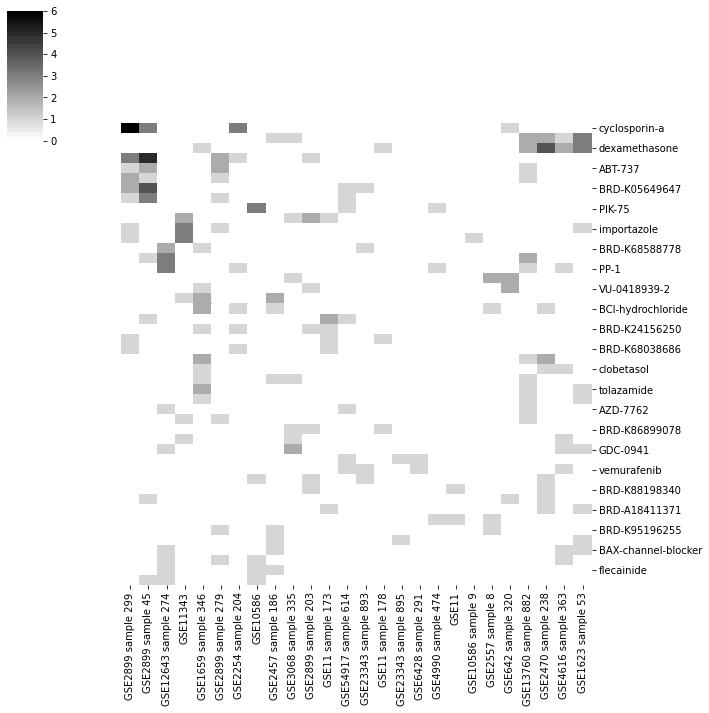

In [26]:
if (top_mimickers_df.shape[1] > 0):
    heatmap(top_mimickers_df, "consensus_mimickers.svg", width, height)
else:
    print("No drugs found")

**Figure 2** Consensus mimickers heatmap [download figure](./consensus_mimickers.svg)

## Reversers

In [27]:
reversers_df = pd.DataFrame(index=signatures.keys())
for k,v in signatures.items():
    for sig in v["opposite"]:
        sig_id = sig["sig_id"]
        m = re.match(pattern, sig_id)
        pert_id = m.group("drug")
        drug_name = drug_meta.loc[pert_id, "pert_iname"]
        drug = pert_id if pert_id == drug_name else "%s-%s" %(pert_id, drug_name)
        if drug not in reversers_df.columns:
            reversers_df[drug] = 0
        reversers_df.at[k, drug] += 1
reversers_df = reversers_df.transpose()

# Get only drugs that appear on a percentage of the queries (defined by drug_perc)
reversers_df = reversers_df[(reversers_df > 0).sum(1) > (num_sigs* drug_perc)]
reversers_df.to_csv("reversers.tsv", sep="\t")
reversers_df.head(10)

,GSE11343,GSE10586,GSE11,GSE10586 sample 9,GSE12643 sample 274,GSE2899 sample 299,GSE2899 sample 279,GSE54917 sample 614,GSE4990 sample 474,GSE2899 sample 45,...,GSE2899 sample 203,GSE3068 sample 335,GSE642 sample 320,GSE1659 sample 346,GSE23343 sample 895,GSE6428 sample 291,GSE13760 sample 882,GSE4616 sample 363,GSE1623 sample 53,GSE11 sample 173
doxorubicin,4,1,0,0,0,0,1,0,0,0,...,1,0,2,1,0,0,0,0,0,0
PIK-75,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
malonoben,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
wortmannin,1,1,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
brefeldin-a,1,0,0,0,1,0,0,0,0,0,...,0,2,0,0,0,5,0,0,0,0
CGP-60474,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
tyrphostin-AG-1478,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
pirarubicin,1,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
daunorubicin,2,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
JNK-9L,1,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


**Table 7** Reverser drug counts ([download](./reversers.tsv))

### Consensus reverser drugs

In [28]:
# Get background distribution
empirical_reversers_stat = empirical_reversers_dist.loc[reversers_df.index]

In [29]:
top_reverser_drugs = reversers_df.sum(1).to_frame(name="counts")
top_reverser_drugs["number of signature queries"] = (reversers_df > 0).sum(1)
top_reverser_drugs["sample mean"] = reversers_df.mean(1)
top_reverser_drugs["sample stdev"] = reversers_df.std(1)
top_reverser_drugs["empirical mean (creeds)"] = empirical_reversers_stat["mean"]
top_reverser_drugs["empirical stdev (creeds)"] = empirical_reversers_stat["stdev"]

#### z-test
$z=\frac{\bar{x}-\mu}{\frac{\sigma}{\sqrt{n}}}$

Where:
- $\bar{x}$ is the sample signatures for a drug
- $\mu$ is the computed empirical mean of the drugs using CREEDS signatures
- $\sigma$ is the computed empirical standard deviation of the drugs using CREEDS signatures
- $n$ is the number of signatures

In [30]:
# Compute zstat and p-value
top_reverser_drugs["zstat"] = (top_reverser_drugs["sample mean"] - empirical_reversers_stat["mean"]) / (empirical_reversers_stat["stdev"]/math.sqrt(num_sigs))
top_reverser_drugs["p value"] = top_reverser_drugs.zstat.apply(lambda x: 1-st.norm.cdf(x))

# Filter by p-value
top_reverser_drugs = top_reverser_drugs[top_reverser_drugs["p value"]<alpha].sort_values(by=["p value"])

# Save tsv
top_reverser_drugs.to_csv("consensus_reverser_drugs.tsv", sep="\t")
top_reverser_drugs.head(10)

,counts,number of signature queries,sample mean,sample stdev,empirical mean (creeds),empirical stdev (creeds),zstat,p value
BRD-K85660637,3,3,0.115385,0.325813,0.005373,0.074837,7.495629,3.297362e-14
SD-6-035-A8,3,3,0.115385,0.325813,0.008187,0.090118,6.065381,6.582053e-10
brefeldin-a,25,6,0.961538,2.584272,0.282717,0.896598,3.860505,5.657641e-05
BRD-K71670746,3,3,0.115385,0.325813,0.017142,0.130791,3.830080,6.405090e-05
tyrphostin-AG-126,6,4,0.230769,0.587040,0.050403,0.249396,3.687678,1.131548e-04
cytochalasin-d,6,4,0.230769,0.651625,0.055136,0.247618,3.616681,1.492024e-04
BRD-K00028814,3,3,0.115385,0.325813,0.018933,0.136298,3.608343,1.540792e-04
pirarubicin,5,4,0.192308,0.491466,0.042599,0.217226,3.514153,2.205791e-04
BRD-K68548958,5,3,0.192308,0.567044,0.042344,0.222512,3.436525,2.946136e-04
VU-0365118-1,3,3,0.115385,0.325813,0.020468,0.143400,3.375036,3.690303e-04


**Table 8** Consensus reverser drugs ([download](./consensus_reverser_drugs.tsv))

Table shape

In [31]:
top_reverser_drugs.shape

(34, 8)

In [32]:
top_reversers_df = reversers_df.loc[top_reverser_drugs.index]
if (top_reversers_df.shape[1] > 0):
    clustergrammer(top_reversers_df, "consensus_reversers_clust.tsv", clustergrammer_url, 3, "Consensus reverser drugs clustergrammer")
else:
    print("No drugs found")

**Figure 3** Consensus reverser drugs clustergrammer [Go to url](https://amp.pharm.mssm.edu/clustergrammer/viz/5f2c4c5d91996d10e2ff9091/consensus_reversers_clust.tsv)

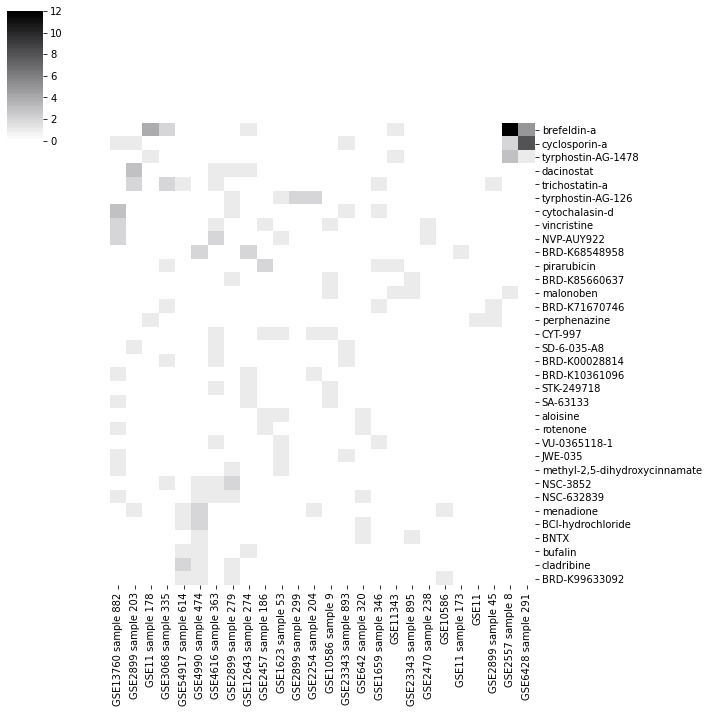

In [37]:
if (top_reversers_df.shape[1] > 0):
    heatmap(top_reversers_df, "consensus_reversers.svg", width, height)
else:
    print("No drugs found")

**Figure 8** Consensus reversers heatmap [download figure](./consensus_reversers.svg)

## References
[1] Wang Z, Lachmann A, Keenan AB, Ma'ayan A (2018) L1000FWD: fireworks visualization of drug-induced transcriptomic signatures. Bioinformatics doi: 10.1093/bioinformatics/bty060

[2] Wang, Z., Monteiro, C. D., Jagodnik, K. M., Fernandez, N. F., Gundersen, G. W., ... & Ma'ayan, A. (2016) Extraction and Analysis of Signatures from the Gene Expression Omnibus by the Crowd. Nature Communications doi: 10.1038/ncomms12846

[3] Fernandez, N. F. et al. Clustergrammer, a web-based heatmap visualization and analysis tool for high-dimensional biological data. Sci. Data 4:170151 doi: 10.1038/sdata.2017.151 (2017).
